In [ ]:
from google.colab import files
upload=files.upload()

Saving Final Premier League Data.csv to Final Premier League Data.csv


## **DATASET**

In [ ]:
import pandas as pd

data = pd.read_csv('Final Premier League Data.csv')

In [ ]:
data

,Player,Season,Born,Age,Squad,Nation,Previous Market Value,Market Value,Position,App,...,Blocks,Interceptions,Fouls,Last man,Tackles,ELG,OwnGoal,Clears,ABW,ABL
0,Éder,2015-2016,1987,27,Swansea City,Portugal,5500000,4500000,FW,13,...,0,0,11,0,4,0,0,7,9,20
1,Álvaro Morata,2017-2018,1992,25,Chelsea,Spain,44000000,58500000,FW,31,...,4,6,41,0,13,0,0,20,54,59
2,Álvaro Morata,2018-2019,1992,25,Chelsea,Spain,58500000,45000000,FW,16,...,1,0,19,0,8,0,0,6,18,28
3,Álvaro Negredo,2016-2017,1985,30,Middlesbrough,Spain,8250000,6750000,FW,36,...,3,10,45,0,18,0,0,65,175,177
4,Aaron Cresswell,2018-2019,1989,28,West Ham United,England,13200000,9900000,DF,20,...,7,23,2,1,29,0,0,42,25,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1463,Youri Tielemans,2018-2019,1997,21,Leicester City,Belgium,22000000,41800000,MF,13,...,2,5,10,0,17,0,0,11,12,9
1464,Yves Bissouma,2018-2019,1996,21,Brighton and Hove Albion,Mali,13500000,13500000,MF,28,...,5,33,40,0,62,1,0,25,27,31
1465,Zanka,2018-2019,1990,28,Huddersfield Town,Denmark,5500000,5500000,MF,24,...,14,69,33,0,49,0,0,82,36,52
1466,Zanka,2017-2018,1990,27,Huddersfield Town,Denmark,2750000,5500000,DF,38,...,20,76,45,0,55,1,0,241,88,82


## **DATA PROCESSING**

In [ ]:
df = pd.DataFrame()
df['Age'] = data['Age']
df['Previous Market Value'] = data['Previous Market Value']
df['Market Value'] = data['Market Value']
df['Position'] = data['Position']
df['Minutes'] = data['Minutes']
df['Goals/90'] = (data['Goals']/data['Minutes'])*60
df['Assists/90'] = (data['Assists']/data['Minutes'])*60
df['SOT/90'] = (data['SOT']/data['Minutes'])*60
df['ThrBall/90'] = (data['ThrBall']/data['Minutes'])*60
df['Interceptions/90'] = (data['Interceptions']/data['Minutes'])*60
df['Tackles/90'] = (data['Tackles']/data['Minutes'])*60
df['Clears'] = (data['Clears']/data['Minutes'])*60
df['Squad'] = data['Squad']
df['Nation'] = data['Nation']

In [ ]:
df

,Age,Previous Market Value,Market Value,Position,Minutes,Goals/90,Assists/90,SOT/90,ThrBall/90,Interceptions/90,Tackles/90,Clears,Squad,Nation
0,27,5500000,4500000,FW,269,0.000000,0.000000,0.223048,0.000000,0.000000,0.892193,1.561338,Swansea City,Portugal
1,25,44000000,58500000,FW,2067,0.319303,0.174165,0.986938,0.087083,0.174165,0.377358,0.580552,Chelsea,Spain
2,25,58500000,45000000,FW,943,0.318134,0.000000,1.018028,0.063627,0.000000,0.509014,0.381760,Chelsea,Spain
3,30,8250000,6750000,FW,2877,0.187696,0.083420,0.479666,0.062565,0.208551,0.375391,1.355579,Middlesbrough,Spain
4,28,13200000,9900000,DF,1590,0.000000,0.037736,0.000000,0.000000,0.867925,1.094340,1.584906,West Ham United,England
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1463,21,22000000,41800000,MF,1091,0.164986,0.219982,0.659945,0.604950,0.274977,0.934922,0.604950,Leicester City,Belgium
1464,21,13500000,13500000,MF,1768,0.000000,0.000000,0.101810,0.101810,1.119910,2.104072,0.848416,Brighton and Hove Albion,Mali
1465,28,5500000,5500000,MF,2148,0.083799,0.027933,0.111732,0.000000,1.927374,1.368715,2.290503,Huddersfield Town,Denmark
1466,27,2750000,5500000,DF,3420,0.000000,0.035088,0.052632,0.035088,1.333333,0.964912,4.228070,Huddersfield Town,Denmark


# **ADDING IDs FOR HIERARCHICAL CATEGORIES: POSITION, TEAM, AND NATIONALITY**

In [ ]:
df['PosID'] = [None] * len(data)
pos_id =[]
pos = df['Position'].unique()
pos_id_index = 0
for i in pos:
  index = 0
  for j in df['Position']:
    if j == i:
      df['PosID'][index] = pos_id_index
    index += 1
  pos_id_index += 1

df['PosID'] = df['PosID'].astype(int)

<ipython-input-8-de5627fd982d>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PosID'][index] = pos_id_index


In [ ]:
df['SquadID'] = [None] * len(data)
pos_id =[]
pos = df['Squad'].unique()
pos_id_index = 0
for i in pos:
  index = 0
  for j in df['Squad']:
    if j == i:
      df['SquadID'][index] = pos_id_index
    index += 1
  pos_id_index += 1

df['SquadID'] = df['SquadID'].astype(int)

<ipython-input-9-4d6329ba0cf2>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SquadID'][index] = pos_id_index


In [ ]:
nation_to_id = {nation: idx for idx, nation in enumerate(df['Nation'].unique())}

# Use the map function to assign 'NatID' based on the dictionary
df['NatID'] = df['Nation'].map(nation_to_id)
df['NatID'] = df['NatID'].astype(int)

In [ ]:
df

,Age,Previous Market Value,Market Value,Position,Minutes,Goals/90,Assists/90,SOT/90,ThrBall/90,Interceptions/90,Tackles/90,Clears,Squad,Nation,PosID,SquadID,NatID
0,27,5500000,4500000,FW,269,0.000000,0.000000,0.223048,0.000000,0.000000,0.892193,1.561338,Swansea City,Portugal,0,0,0
1,25,44000000,58500000,FW,2067,0.319303,0.174165,0.986938,0.087083,0.174165,0.377358,0.580552,Chelsea,Spain,0,1,1
2,25,58500000,45000000,FW,943,0.318134,0.000000,1.018028,0.063627,0.000000,0.509014,0.381760,Chelsea,Spain,0,1,1
3,30,8250000,6750000,FW,2877,0.187696,0.083420,0.479666,0.062565,0.208551,0.375391,1.355579,Middlesbrough,Spain,0,2,1
4,28,13200000,9900000,DF,1590,0.000000,0.037736,0.000000,0.000000,0.867925,1.094340,1.584906,West Ham United,England,1,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1463,21,22000000,41800000,MF,1091,0.164986,0.219982,0.659945,0.604950,0.274977,0.934922,0.604950,Leicester City,Belgium,2,17,11
1464,21,13500000,13500000,MF,1768,0.000000,0.000000,0.101810,0.101810,1.119910,2.104072,0.848416,Brighton and Hove Albion,Mali,2,23,31
1465,28,5500000,5500000,MF,2148,0.083799,0.027933,0.111732,0.000000,1.927374,1.368715,2.290503,Huddersfield Town,Denmark,2,6,25
1466,27,2750000,5500000,DF,3420,0.000000,0.035088,0.052632,0.035088,1.333333,0.964912,4.228070,Huddersfield Town,Denmark,1,6,25


In [ ]:
import numpy as np
y = np.array(df['Market Value'])
Xtest = np.array([df['Previous Market Value'], df['Age'], df['Minutes'], df['Goals/90'], df['Assists/90'], df['SOT/90'], df['ThrBall/90'], df['Interceptions/90'], df['Tackles/90'], df['Clears']]).T

In [ ]:
import pymc as pm

# **BUILDING A BASE MODEL**

In [ ]:
with pm.Model() as unpooled_model:
    # Intercept for each county, distributed around group mean mu_a
    beta0 = pm.Normal('beta0', mu=0, sigma=2)
    # Slope for each county, distributed around group mean mu_b
    beta1 = pm.Normal('beta1', mu=0, sigma=2)
    beta2 = pm.Normal('beta2', mu=0, sigma=2)
    beta3 = pm.Normal('beta3', mu=0, sigma=2)
    beta4 = pm.Normal('beta4', mu=0, sigma=2)
    beta5 = pm.Normal('beta5', mu=0, sigma=2)
    beta6 = pm.Normal('beta6', mu=0, sigma=2)
    beta7 = pm.Normal('beta7', mu=0, sigma=2)
    beta8 = pm.Normal('beta8', mu=0, sigma=2)
    beta9 = pm.Normal('beta9', mu=0, sigma=2)
    beta10 = pm.Normal('beta10', mu=0, sigma=2)

    sigma=pm.HalfCauchy('std', beta=1)
    # Expected value
    mu_ik = beta0 + beta1 * df['Previous Market Value'] + beta2 * df['Age'] + beta3 * df['Minutes'] + beta4 * df['Goals/90'] + beta5 * df['Assists/90'] + beta6 * df['SOT/90'] + beta7 * df['ThrBall/90'] + beta8 * df['Interceptions/90'] + beta9 * df['Tackles/90'] + beta10 * df['Clears']

    # Data likelihood
    y_like = pm.Normal('y_like', mu=mu_ik, sigma=sigma, observed=y)

In [ ]:
with unpooled_model:
    unpooled_trace = pm.sample(return_inferencedata=True)

In [ ]:
pm.summary(unpooled_trace)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta0,-0.000,2.035,-3.847,3.945,0.036,0.050,3215.0,1507.0,1.0
beta1,1.144,0.010,1.125,1.164,0.000,0.000,2460.0,1302.0,1.0
beta2,0.009,1.994,-3.749,3.635,0.034,0.046,3391.0,1524.0,1.0
beta3,0.235,1.909,-3.099,4.066,0.036,0.044,2861.0,1364.0,1.0
beta4,0.007,1.985,-3.641,3.817,0.037,0.049,2878.0,1364.0,1.0
beta5,0.042,2.071,-3.770,3.970,0.036,0.050,3378.0,1229.0,1.0
beta6,-0.032,1.981,-3.990,3.496,0.039,0.044,2644.0,1731.0,1.0
beta7,-0.028,2.038,-3.768,3.841,0.041,0.049,2498.0,1320.0,1.0
beta8,-0.071,1.931,-3.796,3.673,0.035,0.047,2973.0,1269.0,1.0
beta9,0.032,1.988,-3.441,3.966,0.041,0.044,2375.0,1504.0,1.0


<function matplotlib.pyplot.show(close=None, block=None)>

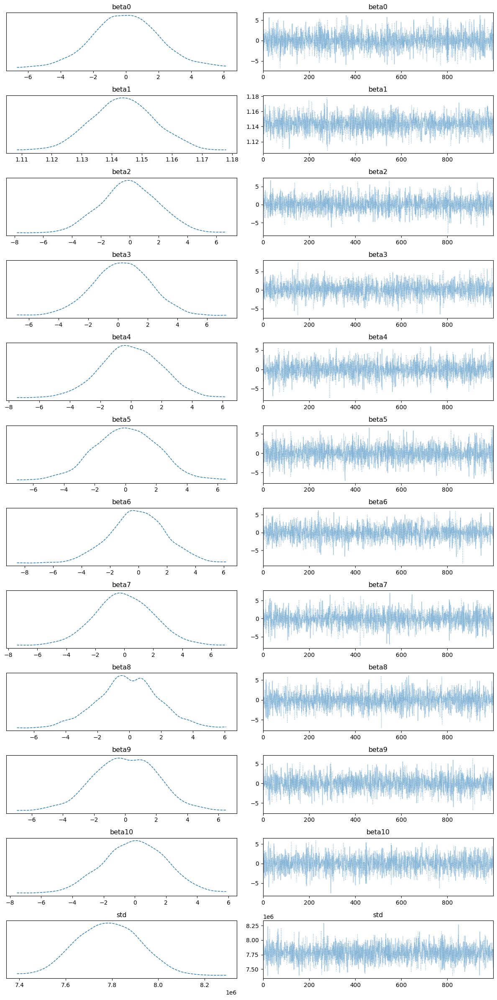

In [ ]:
import matplotlib.pyplot as plt
pm.plot_trace(unpooled_trace, combined=True);
plt.tight_layout()
plt.show

In [ ]:
import seaborn as sns

# **LOOKING AT VARIANCE IN X VARIABLES BY TEAM**

<Axes: xlabel='SquadID', ylabel='Previous Market Value'>

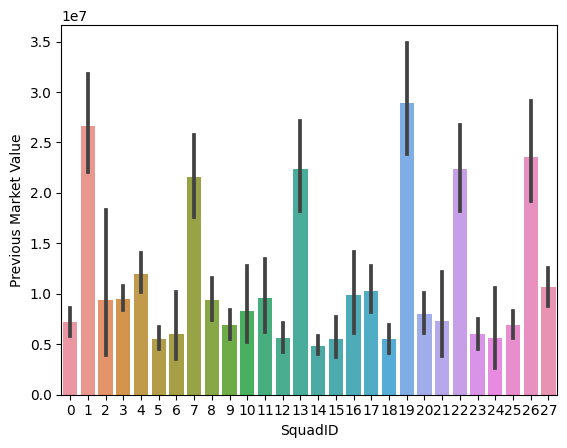

In [ ]:
sns.barplot(x=df['SquadID'], y=df['Previous Market Value'], data=data)

<Axes: xlabel='SquadID', ylabel='Age'>

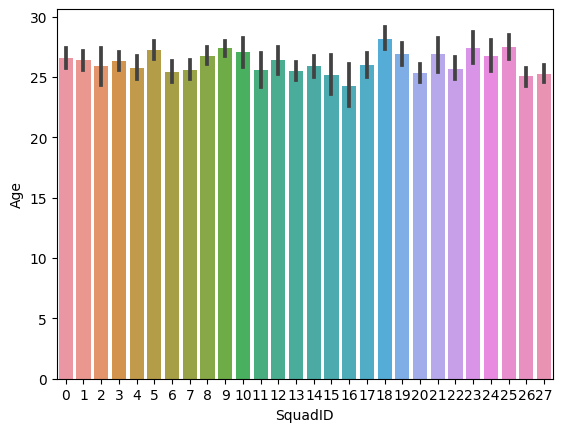

In [ ]:
sns.barplot(x=df['SquadID'], y=df['Age'], data=data)

<Axes: xlabel='SquadID', ylabel='Minutes'>

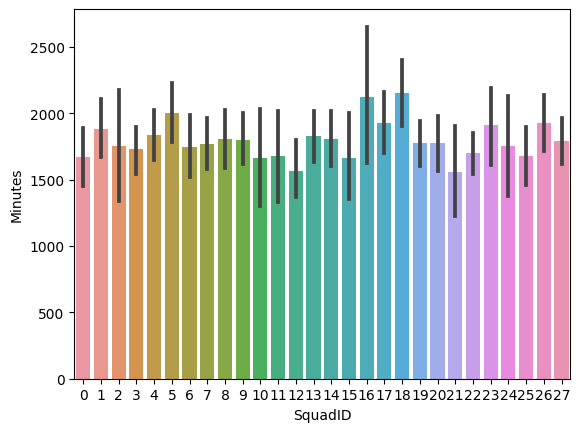

In [ ]:
sns.barplot(x=df['SquadID'], y=df['Minutes'], data=data)

<Axes: xlabel='SquadID', ylabel='Goals/90'>

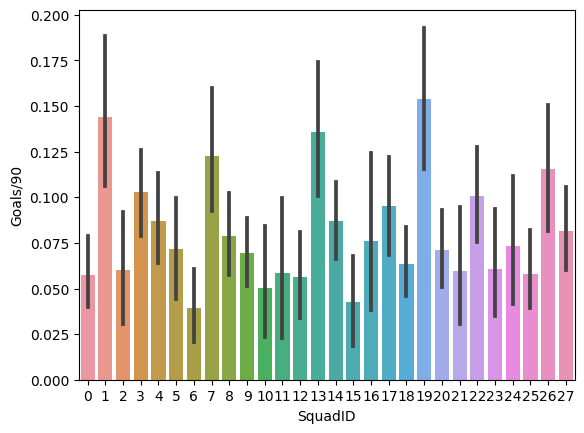

In [ ]:
sns.barplot(x=df['SquadID'], y=df['Goals/90'], data=data)

<Axes: xlabel='SquadID', ylabel='Assists/90'>

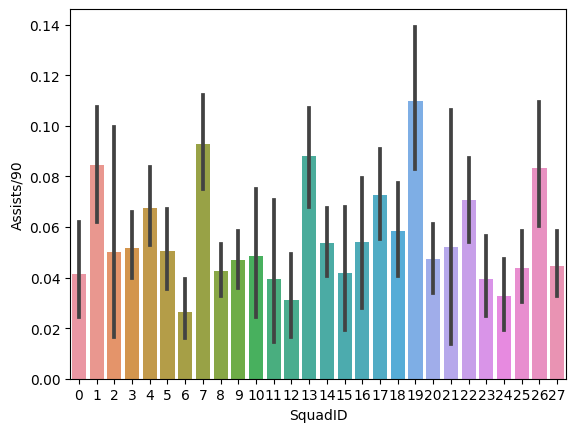

In [ ]:
sns.barplot(x=df['SquadID'], y=df['Assists/90'], data=data)

<Axes: xlabel='SquadID', ylabel='SOT/90'>

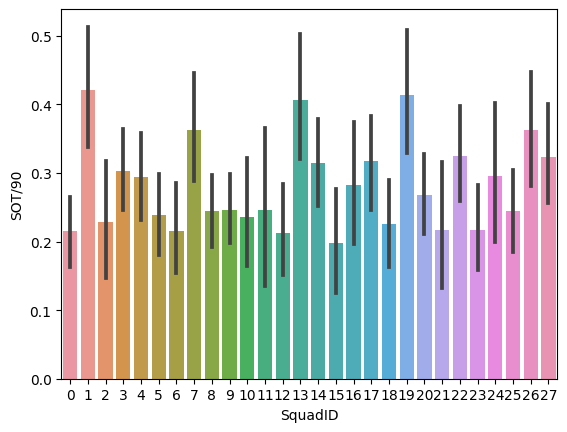

In [ ]:
sns.barplot(x=df['SquadID'], y=df['SOT/90'], data=data)

<Axes: xlabel='SquadID', ylabel='ThrBall/90'>

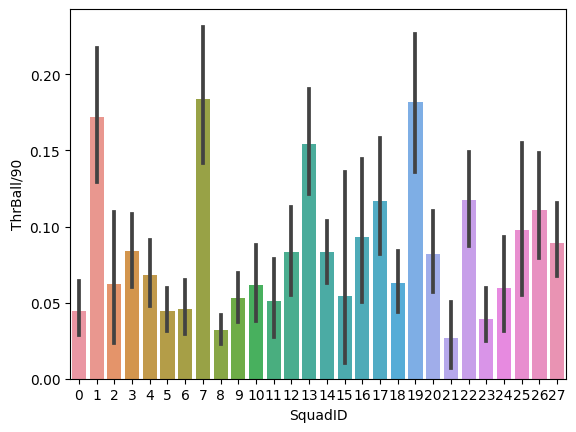

In [ ]:
sns.barplot(x=df['SquadID'], y=df['ThrBall/90'], data=data)

<Axes: xlabel='SquadID', ylabel='Interceptions/90'>

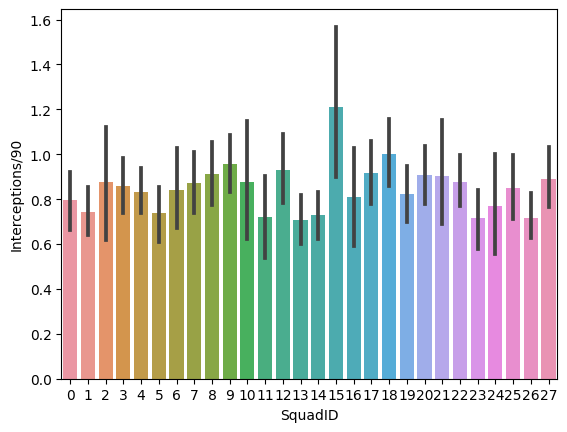

In [ ]:
sns.barplot(x=df['SquadID'], y=df['Interceptions/90'], data=data)

<Axes: xlabel='SquadID', ylabel='Tackles/90'>

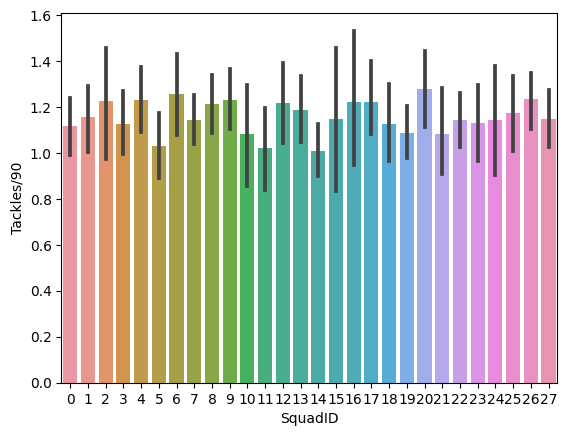

In [ ]:
sns.barplot(x=df['SquadID'], y=df['Tackles/90'], data=data)

<Axes: xlabel='SquadID', ylabel='Clears'>

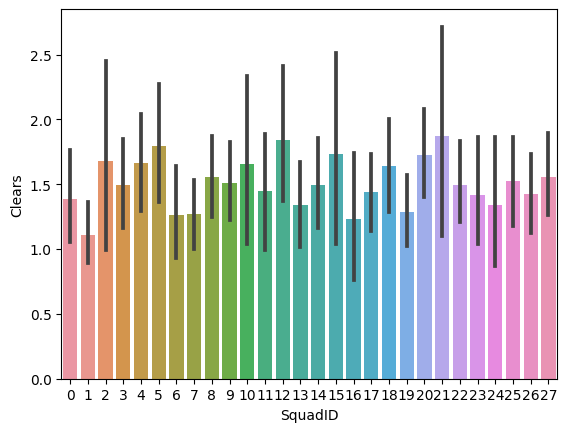

In [ ]:
sns.barplot(x=df['SquadID'], y=df['Clears'], data=data)

### **HIERARCHICAL MODEL BY TEAM**
USING HIERARCHICAL TERMS FOR VARIABLES WITH HIGH HETEROSKEDASTICITY

In [ ]:
with pm.Model() as hierarchical_model1:
    mu_beta0 = pm.Normal('mu_beta0', mu=-3, sigma=2)
    sigma_beta0 = pm.HalfCauchy('sigma_beta0', beta=1)
    mu_beta1 = pm.Normal('mu_beta1', mu=-3, sigma=2)
    sigma_beta1 = pm.HalfCauchy('sigma_beta1', beta=1)
    mu_beta4 = pm.Normal('mu_beta4', mu=-3, sigma=2)
    sigma_beta4 = pm.HalfCauchy('sigma_beta4', beta=1)
    mu_beta5 = pm.Normal('mu_beta5', mu=-3, sigma=2)
    sigma_beta5 = pm.HalfCauchy('sigma_beta5', beta=1)
    mu_beta6 = pm.Normal('mu_beta6', mu=-3, sigma=2)
    sigma_beta6 = pm.HalfCauchy('sigma_beta6', beta=1)
    mu_beta7 = pm.Normal('mu_beta7', mu=-3, sigma=2)
    sigma_beta7 = pm.HalfCauchy('sigma_beta7', beta=1)
    mu_beta10 = pm.Normal('mu_beta10', mu=-3, sigma=2)
    sigma_beta10 = pm.HalfCauchy('sigma_beta10', beta=1)

    # Intercept for each county, distributed around group mean mu_a
    beta0_offset = pm.Normal('beta0_offset', mu=0, sigma=1, shape=(len(df['SquadID'].unique())))
    beta0 = pm.Deterministic('beta0', mu_beta0 + beta0_offset * sigma_beta0)
    # Slope for each county, distributed around group mean mu_b
    beta1_offset = pm.Normal('beta1_offset', mu=0, sigma=1, shape=(len(df['SquadID'].unique())))
    beta1 = pm.Deterministic('beta1', mu_beta0 + beta0_offset * sigma_beta0)
    beta2 = pm.Normal('beta2', mu=0, sigma=2)
    beta3 = pm.Normal('beta3', mu=0, sigma=2)
    beta4_offset = pm.Normal('beta4_offset', mu=0, sigma=1, shape=(len(df['SquadID'].unique())))
    beta4 = pm.Deterministic('beta4', mu_beta0 + beta0_offset * sigma_beta0)
    beta5_offset = pm.Normal('beta5_offset', mu=0, sigma=1, shape=(len(df['SquadID'].unique())))
    beta5 = pm.Deterministic('beta5', mu_beta0 + beta0_offset * sigma_beta0)
    beta6_offset = pm.Normal('beta6_offset', mu=0, sigma=1, shape=(len(df['SquadID'].unique())))
    beta6 = pm.Deterministic('beta6', mu_beta0 + beta0_offset * sigma_beta0)
    beta7_offset = pm.Normal('beta7_offset', mu=0, sigma=1, shape=(len(df['SquadID'].unique())))
    beta7 = pm.Deterministic('beta7', mu_beta0 + beta0_offset * sigma_beta0)
    beta8 = pm.Normal('beta8', mu=0, sigma=2)
    beta9 = pm.Normal('beta9', mu=0, sigma=2)
    beta10_offset = pm.Normal('beta10_offset', mu=0, sigma=1, shape=(len(df['SquadID'].unique())))
    beta10 = pm.Deterministic('beta10', mu_beta0 + beta0_offset * sigma_beta0)

    sigma=pm.HalfCauchy('std', beta=1)
    # Expected value
    mu_ik = beta0[df['SquadID']] + beta1[df['SquadID']] * df['Previous Market Value'] + beta2 * df['Age'] + beta3 * df['Minutes'] + beta4[df['SquadID']] * df['Goals/90'] + beta5[df['SquadID']] * df['Assists/90'] + beta6[df['SquadID']] * df['SOT/90'] + beta7[df['SquadID']] * df['ThrBall/90'] + beta8 * df['Interceptions/90'] + beta9 * df['Tackles/90'] + beta10[df['SquadID']] * df['Clears']

    # Data likelihood
    y_like = pm.Normal('y_like', mu=mu_ik, sigma=sigma, observed=y)

In [ ]:
with hierarchical_model1:
    hier_trace1 = pm.sample(return_inferencedata=True, target_accept=0.95)

In [73]:
summary_table = pm.summary(hier_trace1)
summary_table

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu_beta0,1.124,0.032,1.063,1.183,0.001,0.001,1056.0,1178.0,1.01
mu_beta1,-2.994,1.993,-6.750,0.827,0.027,0.031,5673.0,1233.0,1.00
mu_beta4,-2.973,2.009,-6.729,0.748,0.025,0.027,6287.0,1580.0,1.00
mu_beta5,-2.971,1.921,-6.339,0.695,0.026,0.031,5549.0,1305.0,1.00
mu_beta6,-3.028,1.883,-6.710,0.631,0.027,0.026,4821.0,1393.0,1.01
...,...,...,...,...,...,...,...,...,...
beta10[23],1.078,0.101,0.882,1.261,0.002,0.001,3243.0,1334.0,1.00
beta10[24],1.007,0.106,0.812,1.208,0.002,0.001,2922.0,1625.0,1.01
beta10[25],1.043,0.087,0.887,1.208,0.001,0.001,3821.0,1564.0,1.00
beta10[26],1.268,0.028,1.217,1.320,0.001,0.000,1976.0,1613.0,1.00


/usr/local/lib/python3.10/dist-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (33), generating only 20 plots
  warnings.warn(


<function matplotlib.pyplot.show(close=None, block=None)>

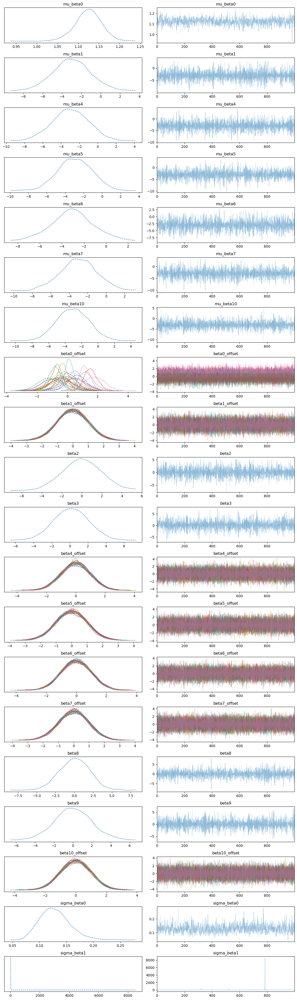

In [52]:
pm.plot_trace(hier_trace1, combined=True);
plt.tight_layout()
plt.show

TEAMS WITH HIGHEST MEAN EFFECT ON MARKET VALUE

In [79]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table[7:35]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [1.799, 1.566, 1.221, 1.158, 0.646, 0.577, 0.511, 0.498, 0.361, 0.122]
Indices: [6, 13, 17, 26, 20, 16, 14, 4, 5, 19]


TEAMS WITH HIGHEST MEAN EFFECT OF PREVIOUS MARKET VALUE ON FUTURE MARKET VALUE

In [87]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table[36:63]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.042, 0.015, 0.01, 0.01, 0.008, 0.007, 0.007, 0.007, 0.006, 0.005]
Indices: [7, 5, 0, 10, 2, 11, 14, 22, 9, 3]


TEAMS WITH HIGHEST MEAN EFFECT OF GOALS/90 ON FUTURE MARKET VALUE

In [93]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table[65:93]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.03, 0.025, 0.02, 0.015, 0.013, 0.012, 0.011, 0.005, 0.004, 0.003]
Indices: [15, 2, 20, 5, 10, 16, 9, 12, 3, 0]


TEAMS WITH HIGHEST MEAN EFFECT OF ASSISTS/90 ON FUTURE MARKET VALUE

In [98]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table[94:121]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.032, 0.021, 0.019, 0.009, 0.005, 0.004, 0.003, 0.003, 0.002, 0.001]
Indices: [6, 0, 19, 16, 13, 24, 1, 5, 26, 11]


TEAMS WITH HIGHEST MEAN EFFECT OF SHOTS ON TARGET/90 ON FUTURE MARKET VALUE

In [102]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table[121:149]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.026, 0.024, 0.023, 0.021, 0.016, 0.014, 0.006, 0.004, 0.003, 0.001]
Indices: [3, 26, 15, 2, 9, 10, 7, 6, 27, 23]


TEAMS WITH HIGHEST MEAN EFFECT OF THROUGH BALLS/90 ON FUTURE MARKET VALUE

In [112]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table[149:177]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.028, 0.025, 0.024, 0.023, 0.019, 0.018, 0.017, 0.016, 0.016, 0.013]
Indices: [10, 12, 27, 2, 20, 25, 13, 0, 3, 21]


TEAMS WITH HIGHEST MEAN EFFECT OF CLEARS/90 ON FUTURE MARKET VALUE

In [123]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table[179:207]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.02, 0.019, 0.018, 0.015, 0.015, 0.013, 0.011, 0.01, 0.01, 0.009]
Indices: [27, 26, 14, 0, 9, 18, 20, 2, 3, 15]


## **LOOKING AT VARIANCE IN X VARIABLES BY POSITION**

<Axes: xlabel='PosID', ylabel='Previous Market Value'>

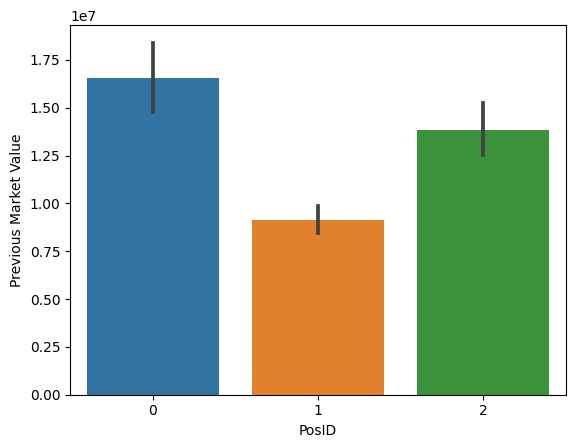

In [ ]:
sns.barplot(x=df['PosID'], y=df['Previous Market Value'], data=data)

<Axes: xlabel='PosID', ylabel='Age'>

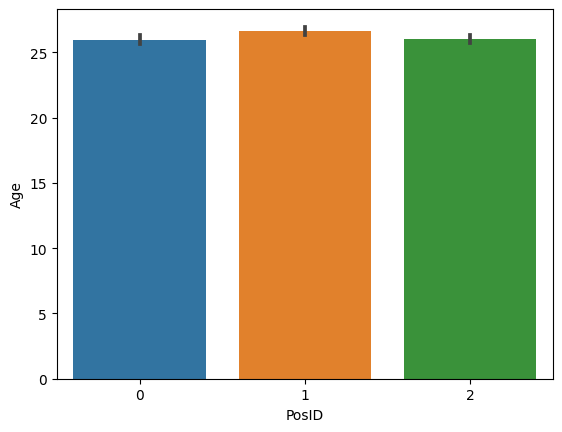

In [ ]:
sns.barplot(x=df['PosID'], y=df['Age'], data=data)

<Axes: xlabel='PosID', ylabel='Minutes'>

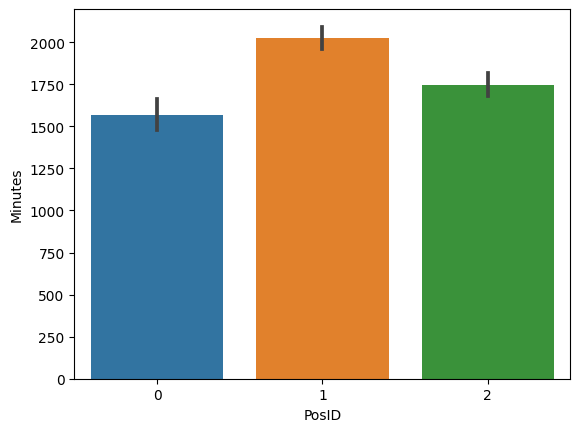

In [ ]:
sns.barplot(x=df['PosID'], y=df['Minutes'], data=data)

<Axes: xlabel='PosID', ylabel='Goals/90'>

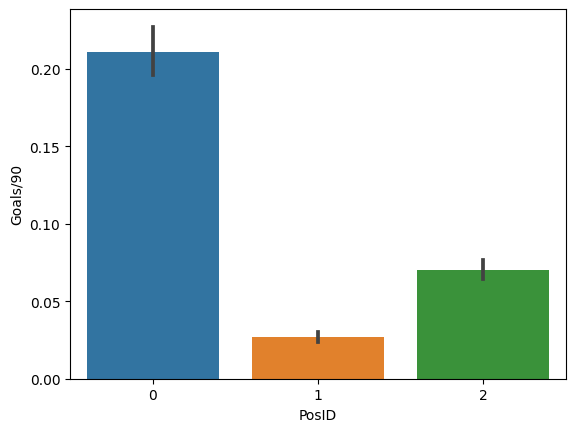

In [ ]:
sns.barplot(x=df['PosID'], y=df['Goals/90'], data=data)

<Axes: xlabel='PosID', ylabel='Assists/90'>

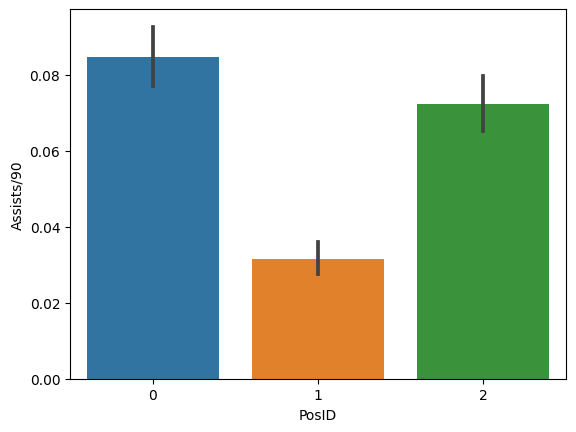

In [ ]:
sns.barplot(x=df['PosID'], y=df['Assists/90'], data=data)

<Axes: xlabel='PosID', ylabel='SOT/90'>

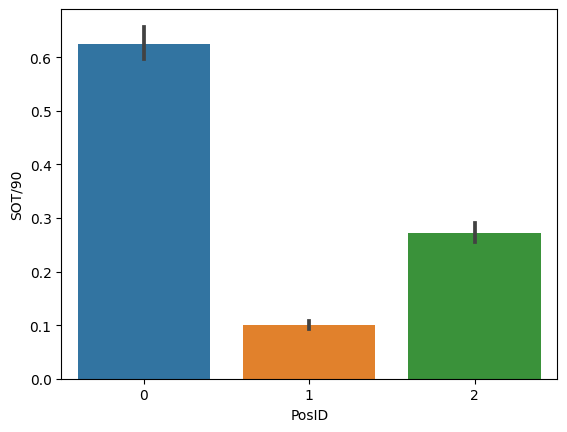

In [ ]:
sns.barplot(x=df['PosID'], y=df['SOT/90'], data=data)

<Axes: xlabel='PosID', ylabel='ThrBall/90'>

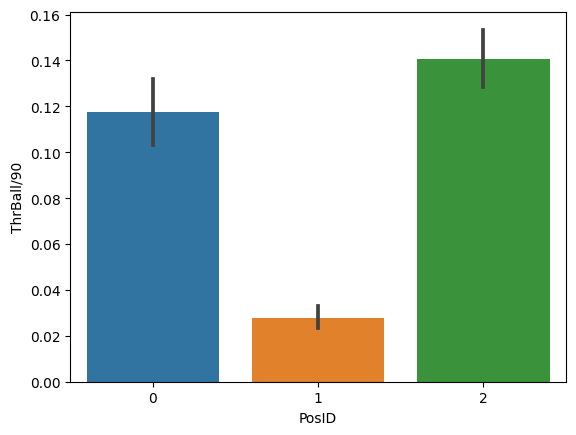

In [ ]:
sns.barplot(x=df['PosID'], y=df['ThrBall/90'], data=data)

<Axes: xlabel='PosID', ylabel='Interceptions/90'>

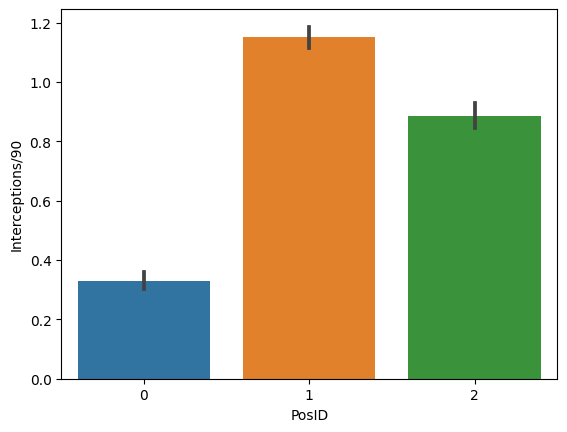

In [ ]:
sns.barplot(x=df['PosID'], y=df['Interceptions/90'], data=data)

<Axes: xlabel='PosID', ylabel='Tackles/90'>

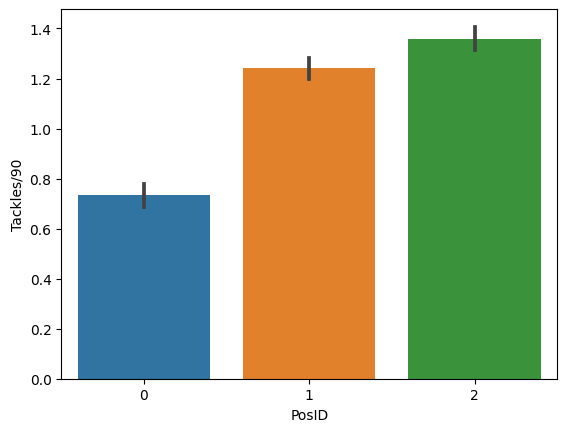

In [ ]:
sns.barplot(x=df['PosID'], y=df['Tackles/90'], data=data)

<Axes: xlabel='PosID', ylabel='Clears'>

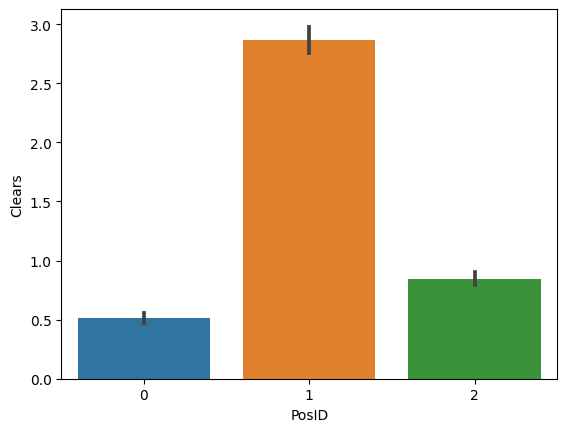

In [ ]:
sns.barplot(x=df['PosID'], y=df['Clears'], data=data)

# HIERARCHICAL MODEL BY POSITION
USING HIERARCHICAL TERMS FOR VARIABLES WITH HIGH HETEROSKEDASTICITY

In [ ]:
with pm.Model() as hierarchical_model:
    mu_beta0 = pm.Normal('mu_beta0', mu=-3, sigma=2)
    sigma_beta0 = pm.HalfCauchy('sigma_beta0', beta=1)
    mu_beta1 = pm.Normal('mu_beta1', mu=5, sigma=2)
    sigma_beta1 = pm.HalfCauchy('sigma_beta1', beta=1)
    mu_beta4 = pm.Normal('mu_beta4', mu=5, sigma=2)
    sigma_beta4 = pm.HalfCauchy('sigma_beta4', beta=1)
    mu_beta5 = pm.Normal('mu_beta5', mu=5, sigma=2)
    sigma_beta5 = pm.HalfCauchy('sigma_beta5', beta=1)
    mu_beta6 = pm.Normal('mu_beta6', mu=5, sigma=2)
    sigma_beta6 = pm.HalfCauchy('sigma_beta6', beta=1)
    mu_beta7 = pm.Normal('mu_beta7', mu=0, sigma=2)
    sigma_beta7 = pm.HalfCauchy('sigma_beta7', beta=1)
    mu_beta8 = pm.Normal('mu_beta8', mu=0, sigma=2)
    sigma_beta8 = pm.HalfCauchy('sigma_beta8', beta=1)
    mu_beta9 = pm.Normal('mu_beta9', mu=0, sigma=2)
    sigma_beta9 = pm.HalfCauchy('sigma_beta9', beta=1)
    mu_beta10 = pm.Normal('mu_beta10', mu=0, sigma=2)
    sigma_beta10 = pm.HalfCauchy('sigma_beta10', beta=1)

    # Intercept for each county, distributed around group mean mu_a
    beta0_offset = pm.Normal('beta0_offset', mu=0, sigma=1, shape=(len(df['PosID'].unique())))
    beta0 = pm.Deterministic('beta0', mu_beta0 + beta0_offset * sigma_beta0)
    # Slope for each county, distributed around group mean mu_b
    beta1_offset = pm.Normal('beta1_offset', mu=0, sigma=1, shape=(len(df['PosID'].unique())))
    beta1 = pm.Deterministic('beta1', mu_beta0 + beta0_offset * sigma_beta0)
    beta2 = pm.Normal('beta2', mu=0, sigma=2)
    beta3 = pm.Normal('beta3', mu=0, sigma=2)
    beta4_offset = pm.Normal('beta4_offset', mu=0, sigma=1, shape=(len(df['PosID'].unique())))
    beta4 = pm.Deterministic('beta4', mu_beta0 + beta0_offset * sigma_beta0)
    beta5_offset = pm.Normal('beta5_offset', mu=0, sigma=1, shape=(len(df['PosID'].unique())))
    beta5 = pm.Deterministic('beta5', mu_beta0 + beta0_offset * sigma_beta0)
    beta6_offset = pm.Normal('beta6_offset', mu=0, sigma=1, shape=(len(df['PosID'].unique())))
    beta6 = pm.Deterministic('beta6', mu_beta0 + beta0_offset * sigma_beta0)
    beta7_offset = pm.Normal('beta7_offset', mu=0, sigma=1, shape=(len(df['PosID'].unique())))
    beta7 = pm.Deterministic('beta7', mu_beta0 + beta0_offset * sigma_beta0)
    beta8_offset = pm.Normal('beta8_offset', mu=0, sigma=1, shape=(len(df['PosID'].unique())))
    beta8 = pm.Deterministic('beta8', mu_beta0 + beta0_offset * sigma_beta0)
    beta9_offset = pm.Normal('beta9_offset', mu=0, sigma=1, shape=(len(df['PosID'].unique())))
    beta9 = pm.Deterministic('beta9', mu_beta0 + beta0_offset * sigma_beta0)
    beta10_offset = pm.Normal('beta10_offset', mu=0, sigma=1, shape=(len(df['PosID'].unique())))
    beta10 = pm.Deterministic('beta10', mu_beta0 + beta0_offset * sigma_beta0)

    sigma=pm.HalfCauchy('std', beta=1)
    # Expected value
    mu_ik = beta0[df['PosID']] + beta1[df['PosID']] * df['Previous Market Value'] + beta2 * df['Age'] + beta3 * df['Minutes'] + beta4[df['PosID']] * df['Goals/90'] + beta5[df['PosID']] * df['Assists/90'] + beta6[df['PosID']] * df['SOT/90'] + beta7[df['PosID']] * df['ThrBall/90'] + beta8[df['PosID']] * df['Interceptions/90'] + beta9[df['PosID']] * df['Tackles/90'] + beta10[df['PosID']] * df['Clears']

    # Data likelihood
    y_like = pm.Normal('y_like', mu=mu_ik, sigma=sigma, observed=y)

In [ ]:
with hierarchical_model:
    hier_trace = pm.sample(return_inferencedata=True, target_accept=0.95)

In [127]:
summary_table1 = pm.summary(hier_trace)
summary_table1

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu_beta0,1.136,0.067,0.952,1.241,0.006,0.004,196.0,80.0,1.02
mu_beta1,5.070,2.042,1.144,8.576,0.048,0.035,1828.0,1448.0,1.01
mu_beta4,4.967,1.891,1.433,8.539,0.064,0.045,891.0,1227.0,1.01
mu_beta5,5.016,1.915,1.666,8.605,0.060,0.050,992.0,747.0,1.00
mu_beta6,4.972,2.025,1.211,8.808,0.036,0.031,3157.0,1097.0,1.01
...,...,...,...,...,...,...,...,...,...
beta9[1],1.162,0.025,1.118,1.210,0.001,0.000,2018.0,1589.0,1.00
beta9[2],1.117,0.016,1.088,1.147,0.000,0.000,1318.0,1385.0,1.00
beta10[0],1.168,0.017,1.137,1.198,0.000,0.000,1774.0,1230.0,1.00
beta10[1],1.162,0.025,1.118,1.210,0.001,0.000,2018.0,1589.0,1.00


/usr/local/lib/python3.10/dist-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (39), generating only 20 plots
  warnings.warn(


<function matplotlib.pyplot.show(close=None, block=None)>

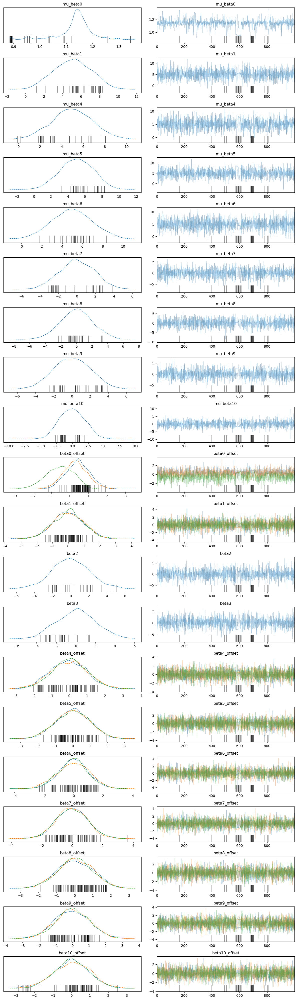

In [55]:
pm.plot_trace(hier_trace, combined=True);
plt.tight_layout()
plt.show

POSITIONS WITH HIGHEST MEAN EFFECT ON MARKET VALUE

In [128]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table1[9:12]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.425, 0.285, -0.552]
Indices: [0, 1, 2]


POSITIONS WITH HIGHEST MEAN EFFECT OF PREVIOUS MARKET VALUE ON FUTURE MARKET VALUE

In [130]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table1[12:15]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.012, 0.01, -0.018]
Indices: [2, 1, 0]


POSITIONS WITH HIGHEST MEAN EFFECT OF GOALS/90 ON FUTURE MARKET VALUE

In [133]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table1[17:20]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.037, -0.008, -0.05]
Indices: [2, 1, 0]


POSITIONS WITH HIGHEST MEAN EFFECT OF ASSISTS/90 ON FUTURE MARKET VALUE

In [135]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table1[20:23]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.035, 0.005, -0.001]
Indices: [0, 2, 1]


POSITIONS WITH HIGHEST MEAN EFFECT OF SHOTS OF TARGET/90 ON FUTURE MARKET VALUE

In [137]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table1[23:26]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.014, -0.011, -0.029]
Indices: [0, 1, 2]


POSITIONS WITH HIGHEST MEAN EFFECT OF THROUGH BALLS/90 ON FUTURE MARKET VALUE

In [138]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table1[26:29]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.006, -0.014, -0.033]
Indices: [0, 2, 1]


POSITIONS WITH HIGHEST MEAN EFFECT OF INTERCEPTIONS/90 ON FUTURE MARKET VALUE

In [139]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table1[29:32]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.039, 0.032, 0.008]
Indices: [1, 2, 0]


POSITIONS WITH HIGHEST MEAN EFFECT OF TACKLES/90 ON FUTURE MARKET VALUE

In [141]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table1[32:35]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.023, 0.018, -0.035]
Indices: [2, 1, 0]


POSITIONS WITH HIGHEST MEAN EFFECT OF CLEARS/90 ON FUTURE MARKET VALUE

In [142]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table1[35:38]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.046, 0.02, -0.01]
Indices: [1, 2, 0]


# **LOOKING AT VARIANCE IN X VARIABLES BY NATION**

<Axes: xlabel='NatID', ylabel='Previous Market Value'>

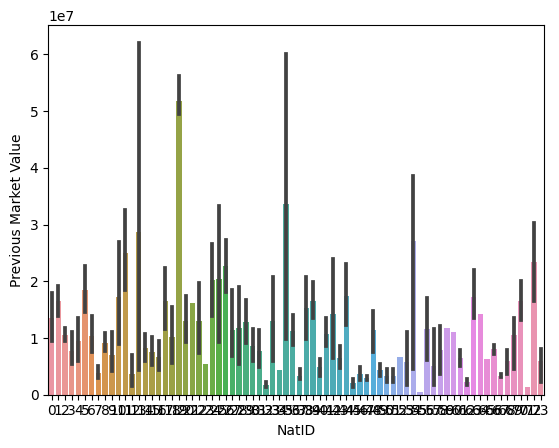

In [ ]:
sns.barplot(x=df['NatID'], y=df['Previous Market Value'], data=data)

<Axes: xlabel='NatID', ylabel='Age'>

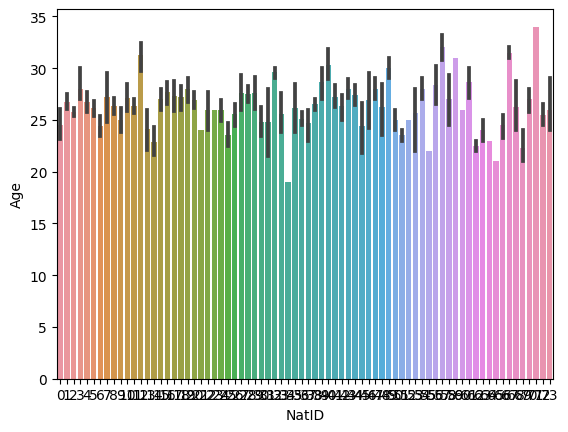

In [ ]:
sns.barplot(x=df['NatID'], y=df['Age'], data=data)

<Axes: xlabel='NatID', ylabel='Minutes'>

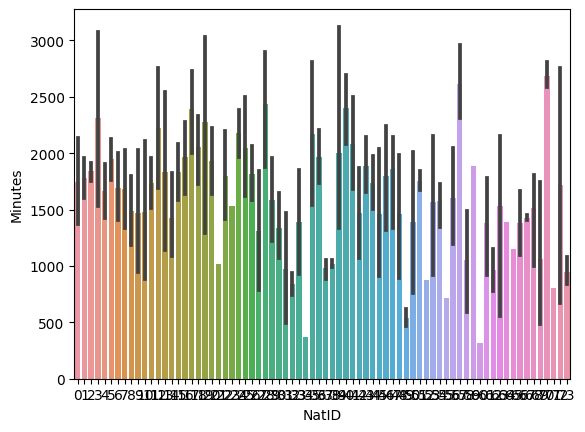

In [ ]:
sns.barplot(x=df['NatID'], y=df['Minutes'], data=data)

<Axes: xlabel='NatID', ylabel='Goals/90'>

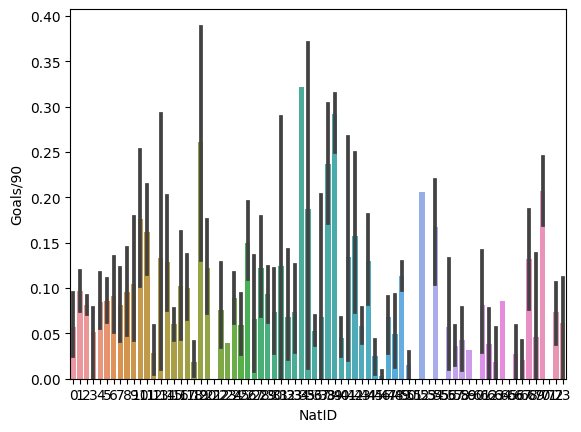

In [ ]:
sns.barplot(x=df['NatID'], y=df['Goals/90'], data=data)

<Axes: xlabel='NatID', ylabel='Assists/90'>

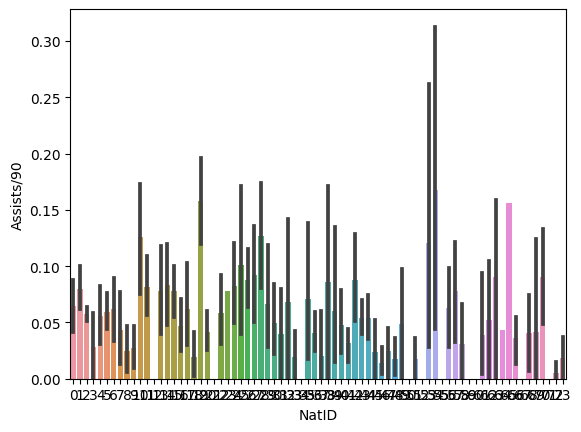

In [ ]:
sns.barplot(x=df['NatID'], y=df['Assists/90'], data=data)

<Axes: xlabel='NatID', ylabel='SOT/90'>

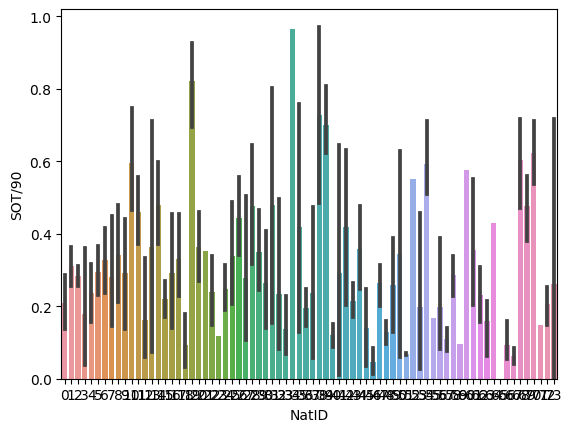

In [ ]:
sns.barplot(x=df['NatID'], y=df['SOT/90'], data=data)

<Axes: xlabel='NatID', ylabel='ThrBall/90'>

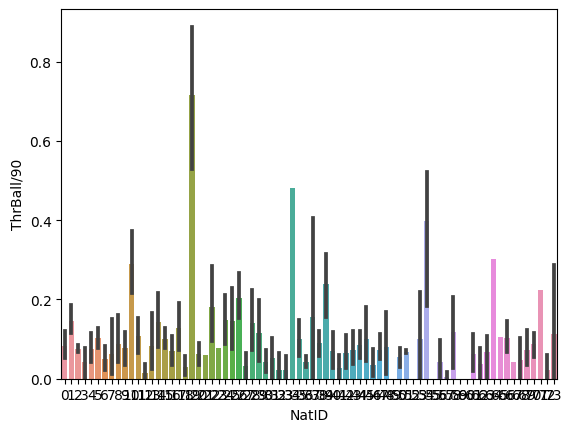

In [ ]:
sns.barplot(x=df['NatID'], y=df['ThrBall/90'], data=data)

<Axes: xlabel='NatID', ylabel='Tackles/90'>

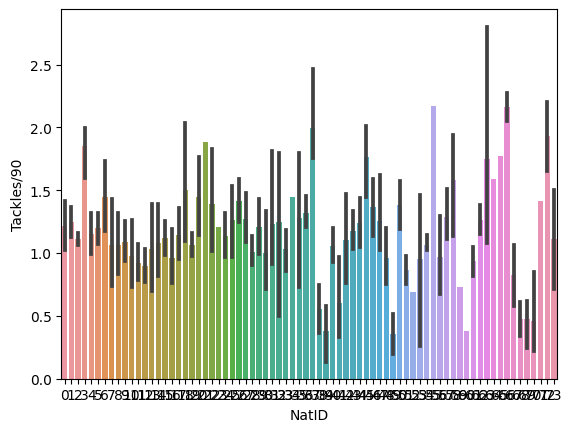

In [ ]:
sns.barplot(x=df['NatID'], y=df['Tackles/90'], data=data)

<Axes: xlabel='NatID', ylabel='Interceptions/90'>

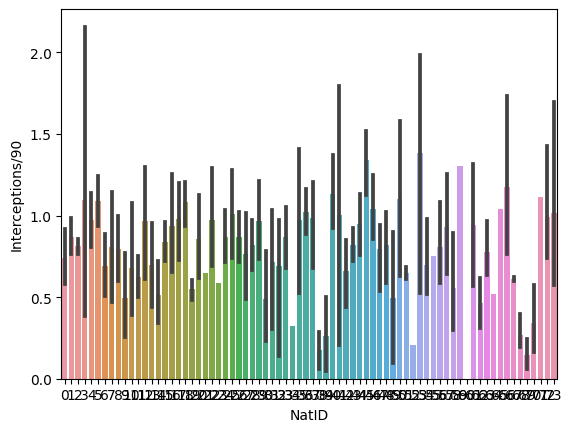

In [ ]:
sns.barplot(x=df['NatID'], y=df['Interceptions/90'], data=data)

<Axes: xlabel='NatID', ylabel='Clears'>

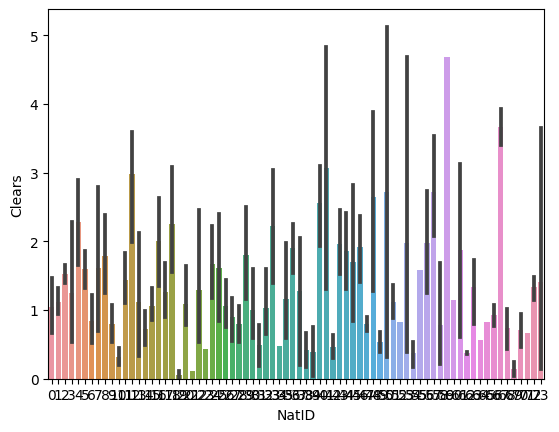

In [ ]:
sns.barplot(x=df['NatID'], y=df['Clears'], data=data)

## **HIERARCHICAL MODEL BY NATIONALITY**
USING HIERARCHICAL TERMS FOR VARIABLES WITH HIGH HETEROSKEDASTICITY

In [ ]:
with pm.Model() as hierarchical_model2:
    mu_beta0 = pm.Normal('mu_beta0', mu=-3, sigma=2)
    sigma_beta0 = pm.HalfCauchy('sigma_beta0', beta=1)
    mu_beta1 = pm.Normal('mu_beta1', mu=-3, sigma=2)
    sigma_beta1 = pm.HalfCauchy('sigma_beta1', beta=1)
    mu_beta4 = pm.Normal('mu_beta4', mu=-3, sigma=2)
    sigma_beta4 = pm.HalfCauchy('sigma_beta4', beta=1)
    mu_beta5 = pm.Normal('mu_beta5', mu=-3, sigma=2)
    sigma_beta5 = pm.HalfCauchy('sigma_beta5', beta=1)
    mu_beta6 = pm.Normal('mu_beta6', mu=-3, sigma=2)
    sigma_beta6 = pm.HalfCauchy('sigma_beta6', beta=1)
    mu_beta7 = pm.Normal('mu_beta7', mu=-3, sigma=2)
    sigma_beta7 = pm.HalfCauchy('sigma_beta7', beta=1)
    mu_beta10 = pm.Normal('mu_beta10', mu=-3, sigma=2)
    sigma_beta10 = pm.HalfCauchy('sigma_beta10', beta=1)

    # Intercept for each county, distributed around group mean mu_a
    beta0_offset = pm.Normal('beta0_offset', mu=0, sigma=1, shape=(len(df['NatID'].unique())))
    beta0 = pm.Deterministic('beta0', mu_beta0 + beta0_offset * sigma_beta0)
    # Slope for each county, distributed around group mean mu_b
    beta1_offset = pm.Normal('beta1_offset', mu=0, sigma=1, shape=(len(df['NatID'].unique())))
    beta1 = pm.Deterministic('beta1', mu_beta0 + beta0_offset * sigma_beta0)
    beta2 = pm.Normal('beta2', mu=0, sigma=2)
    beta3 = pm.Normal('beta3', mu=0, sigma=2)
    beta4_offset = pm.Normal('beta4_offset', mu=0, sigma=1, shape=(len(df['NatID'].unique())))
    beta4 = pm.Deterministic('beta4', mu_beta0 + beta0_offset * sigma_beta0)
    beta5_offset = pm.Normal('beta5_offset', mu=0, sigma=1, shape=(len(df['NatID'].unique())))
    beta5 = pm.Deterministic('beta5', mu_beta0 + beta0_offset * sigma_beta0)
    beta6_offset = pm.Normal('beta6_offset', mu=0, sigma=1, shape=(len(df['NatID'].unique())))
    beta6 = pm.Deterministic('beta6', mu_beta0 + beta0_offset * sigma_beta0)
    beta7_offset = pm.Normal('beta7_offset', mu=0, sigma=1, shape=(len(df['NatID'].unique())))
    beta7 = pm.Deterministic('beta7', mu_beta0 + beta0_offset * sigma_beta0)
    beta8 = pm.Normal('beta8', mu=0, sigma=2)
    beta9 = pm.Normal('beta9', mu=0, sigma=2)
    beta10_offset = pm.Normal('beta10_offset', mu=0, sigma=1, shape=(len(df['NatID'].unique())))
    beta10 = pm.Deterministic('beta10', mu_beta0 + beta0_offset * sigma_beta0)

    sigma=pm.HalfCauchy('std', beta=1)
    # Expected value
    mu_ik = beta0[df['NatID']] + beta1[df['NatID']] * df['Previous Market Value'] + beta2 * df['Age'] + beta3 * df['Minutes'] + beta4[df['NatID']] * df['Goals/90'] + beta5[df['NatID']] * df['Assists/90'] + beta6[df['NatID']] * df['SOT/90'] + beta7[df['NatID']] * df['ThrBall/90'] + beta8 * df['Interceptions/90'] + beta9 * df['Tackles/90'] + beta10[df['NatID']] * df['Clears']

    # Data likelihood
    y_like = pm.Normal('y_like', mu=mu_ik, sigma=sigma, observed=y)

In [ ]:
with hierarchical_model2:
    hier_trace2 = pm.sample(return_inferencedata=True, target_accept=0.95)

In [56]:
summary_table2 = pm.summary(hier_trace2)
summary_table2

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu_beta0,1.122,0.031,1.064,1.179,0.001,0.001,930.0,1004.0,1.0
mu_beta1,-3.038,2.009,-6.870,0.648,0.026,0.029,5760.0,1314.0,1.0
mu_beta4,-2.995,1.984,-6.671,0.633,0.024,0.029,6602.0,1300.0,1.0
mu_beta5,-2.995,2.045,-6.544,0.924,0.028,0.028,5436.0,1456.0,1.0
mu_beta6,-2.991,2.011,-6.683,0.893,0.028,0.033,5260.0,1282.0,1.0
...,...,...,...,...,...,...,...,...,...
beta10[69],1.068,0.165,0.764,1.381,0.002,0.002,5820.0,1507.0,1.0
beta10[70],0.983,0.130,0.728,1.200,0.002,0.001,4429.0,1297.0,1.0
beta10[71],1.122,0.172,0.799,1.445,0.002,0.002,4907.0,1049.0,1.0
beta10[72],1.050,0.113,0.825,1.253,0.002,0.001,5007.0,1279.0,1.0


/usr/local/lib/python3.10/dist-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (33), generating only 20 plots
  warnings.warn(


<function matplotlib.pyplot.show(close=None, block=None)>

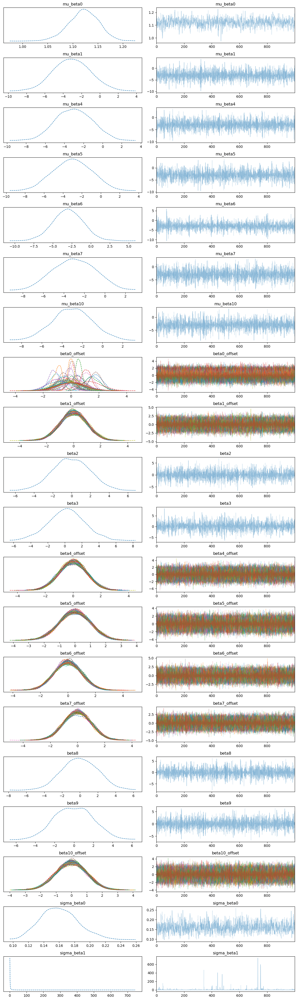

In [57]:
pm.plot_trace(hier_trace2, combined=True);
plt.tight_layout()
plt.show

POSITIONS WITH HIGHEST MEAN EFFECT ON MARKET VALUE

In [58]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table2[7:81]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [1.834, 1.818, 1.557, 1.493, 1.382, 1.173, 1.122, 0.566, 0.507, 0.476]
Indices: [20, 25, 0, 42, 63, 36, 13, 2, 15, 10]


COUNTRIES WITH HIGHEST MEAN EFFECT OF PREVIOUS MARKET VALUE ON FUTURE MARKET VALUE

In [152]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table2[81:155]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.032, 0.028, 0.027, 0.026, 0.023, 0.021, 0.021, 0.021, 0.016, 0.016]
Indices: [60, 38, 24, 29, 8, 2, 4, 5, 6, 39]


COUNTRIES WITH HIGHEST MEAN EFFECT OF GOALS/90 ON FUTURE MARKET VALUE

In [160]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table2[157:231]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.03, 0.029, 0.027, 0.026, 0.025, 0.023, 0.021, 0.019, 0.018, 0.015]
Indices: [42, 12, 17, 1, 16, 39, 10, 4, 60, 20]


COUNTRIES WITH HIGHEST MEAN EFFECT OF ASSISTS/90 ON FUTURE MARKET VALUE

In [166]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table2[231:305]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.024, 0.023, 0.019, 0.018, 0.017, 0.017, 0.012, 0.012, 0.011, 0.011]
Indices: [10, 33, 47, 23, 6, 28, 3, 72, 17, 71]


COUNTRIES WITH HIGHEST MEAN EFFECT OF SHOTS ON TARGET/90 ON FUTURE MARKET VALUE

In [169]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table2[305:379]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.04, 0.032, 0.024, 0.024, 0.022, 0.021, 0.02, 0.019, 0.017, 0.016]
Indices: [44, 50, 9, 29, 1, 8, 55, 61, 24, 52]


COUNTRIES WITH HIGHEST MEAN EFFECT OF THROUGH BALLS/90 ON FUTURE MARKET VALUE

In [173]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table2[379:453]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.038, 0.025, 0.023, 0.023, 0.019, 0.019, 0.017, 0.016, 0.016, 0.015]
Indices: [19, 3, 47, 53, 40, 67, 69, 9, 46, 49]


COUNTRIES WITH HIGHEST MEAN EFFECT OF CLEARS/90 ON FUTURE MARKET VALUE

In [177]:
import heapq
largest_values_with_indices = heapq.nlargest(10, enumerate(summary_table2[455:529]['mean']), key=lambda x: x[1])
values = [value for index, value in largest_values_with_indices]
indices = [index for index, value in largest_values_with_indices]
print("Values:", values)
print("Indices:", indices)

Values: [0.028, 0.023, 0.019, 0.018, 0.018, 0.017, 0.017, 0.016, 0.015, 0.013]
Indices: [31, 42, 15, 34, 37, 21, 39, 71, 12, 8]
